# day 4-3

このノートブックの実行例は[こちら(HTML版)](lecture-gssm2025/notebooks-sample/day-4-3.html)で確認できます

---

In [1]:
%load_ext autoreload
%autoreload 2

import os
import random
import numpy as np

# 再現性のために乱数を固定する
seed = 42
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
random.seed(seed)

## 0. 準備

### 0.1 必要なパッケージのインストール

In [2]:
%%capture
!sudo apt-get update
!sudo apt-get install -y automake autoconf perl libtool graphviz libgraphviz-dev
!pip install -U japanize_matplotlib pyvis pygraphviz mca

教材のダウンロード

In [3]:
!git clone https://github.com/haradatm/lecture-gssm2025

Cloning into 'lecture-gssm2025'...
remote: Enumerating objects: 12, done.
remote: Counting objects: 100% (12/12), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 12 (delta 2), reused 12 (delta 2), pack-reused 0 (from 0)
Receiving objects: 100% (12/12), 355.10 KiB | 1.93 MiB/s, done.
Resolving deltas: 100% (2/2), done.


In [4]:
!ln -s lecture-gssm2025/notebooks/gssm_utils.py .

ln: failed to create symbolic link './gssm_utils.py': File exists


### 0.2 MeCab インストール (時間目安: 約3分)

In [5]:
%%time
!bash lecture-gssm2025/scripts/install_mecab.sh >> install_mecab.log 2>&1
!tail -n 1 install_mecab.log

CPU times: user 1.15 s, sys: 159 ms, total: 1.31 s
Wall time: 3min 2s


### 0.3 CaboCha インストール (時間目安: 約4分)

In [6]:
%%time
!bash lecture-gssm2025/scripts/install_cabocha.sh >> install_cabocha.log 2>&1
!tail -n 1 install_cabocha.log

CPU times: user 1.65 s, sys: 270 ms, total: 1.92 s
Wall time: 4min 29s


### 0.4 セッションの再起動

In [ ]:
import os
os.kill(os.getpid(), 9)

### 0.5 動作確認

In [1]:
import MeCab
tagger = MeCab.Tagger("-r ./tools/usr/local/etc/mecabrc")
print(tagger.parse("今日はいい天気です"))

今日	名詞,副詞可能,*,*,*,*,今日,キョウ,キョー
は	助詞,係助詞,*,*,*,*,は,ハ,ワ
いい	形容詞,自立,*,*,形容詞・イイ,基本形,いい,イイ,イイ
天気	名詞,一般,*,*,*,*,天気,テンキ,テンキ
です	助動詞,*,*,*,特殊・デス,基本形,です,デス,デス
EOS



In [2]:
import CaboCha
cp = CaboCha.Parser("-r ./tools/usr/local/etc/cabocharc")
tree = cp.parse("今日はいい天気です")
print(tree.toString(CaboCha.FORMAT_LATTICE))

* 0 2D 0/1 -1.041733
今日	名詞,副詞可能,*,*,*,*,今日,キョウ,キョー
は	助詞,係助詞,*,*,*,*,は,ハ,ワ
* 1 2D 0/0 -1.041733
いい	形容詞,自立,*,*,形容詞・イイ,基本形,いい,イイ,イイ
* 2 -1D 0/1 0.000000
天気	名詞,一般,*,*,*,*,天気,テンキ,テンキ
です	助動詞,*,*,*,特殊・デス,基本形,です,デス,デス
EOS



---

## 1. テキスト分析 (実践編)

### 1.0 事前準備

#### 1.0.1 定義済み関数の読み込み

以下のセルを**修正せず**に実行してください

In [3]:
import warnings
warnings.simplefilter('ignore')

import gssm_utils

%matplotlib inline

#### 1.0.1 データのダウンロード (前回ダウンロード済みのためスキップ)

以下のデータがダウンロード済みです

| ファイル名 | 件数 | データセット | 備考 |
| --- | --- | --- | --- |
| rakuten-1000-2024-2025.xlsx.zip | 10,000 | •レジャー+ビジネスの 10エリア<br>•エリアごと 1,000件 (ランダムサンプリング)<br>•期間: 2024/1~2025 GW明け | 本講義の全体を通して使用する |

In [4]:
# rakuten-1000-2024-2025.xlsx.zip をダウンロードする
FILE_ID = "1yKabZ7qJMRrIrP4Vtq-RrSZAqFsZriQS"
!gdown {FILE_ID}
!unzip -o rakuten-1000-2024-2025.xlsx.zip

Downloading...
From: https://drive.google.com/uc?id=1yKabZ7qJMRrIrP4Vtq-RrSZAqFsZriQS
To: /content/rakuten-1000-2024-2025.xlsx.zip
100% 2.61M/2.61M [00:00<00:00, 136MB/s]
Archive:  rakuten-1000-2024-2025.xlsx.zip
  inflating: rakuten-1000-2024-2025.xlsx  


#### 1.0.2 データの読み込み (DataFrame型)

In [5]:
import numpy as np
import pandas as pd

all_df = pd.read_excel("rakuten-1000-2024-2025.xlsx")
print(all_df.shape)
display(all_df.head())

(10000, 19)


,カテゴリー,エリア,施設番号,施設名,コメント,総合,サービス,立地,部屋,設備・アメニティ,風呂,食事,旅行の目的,同伴者,宿泊年月,投稿者,年代,性別,投稿日
0,A_レジャー,01_登別,29995,ゆとりろ洞爺湖,わんこと泊まれて良かった！,3,3,3,3,3.0,4.0,3.0,レジャー,家族,45413,投稿者,na,na,45445.668553
1,A_レジャー,01_登別,9691,登別温泉 ホテルゆもと登別,古い建物ですがきれいにしている感じでした。入った瞬間においが気になりましたが、タバコのにおい...,5,5,5,4,5.0,4.0,5.0,レジャー,家族,45474,mamemama3,40代,女性,45499.742442
2,A_レジャー,01_登別,40708,虎杖浜温泉 ホテル いずみ,3月15日に初めて宿泊させて頂きました。予約プランは和室6畳でしたが、空きがあるとのことで1...,5,5,5,5,5.0,5.0,5.0,レジャー,家族,45717,ハコ9437,40代,女性,45733.810486
3,A_レジャー,01_登別,139962,ザ レイクビュー ＴＯＹＡ 乃の風リゾート,大きめ柴犬と宿泊しましたが、部屋は充分な広さでした夕朝食のブッフェも、種類豊富で美味しかった...,4,5,5,4,4.0,4.0,5.0,レジャー,家族,45413,投稿者,na,na,45440.662477
4,A_レジャー,01_登別,168374,虎杖浜天然温泉 「旅人の湯」ホテルルートインＧｒａｎｄ室蘭,コーヒー無料サービスが嬉しい。水のペットボトルサービスがあるとさらに良い（最近デフォルトのビ...,4,3,4,4,3.0,3.0,NaN,ビジネス,一人,45505,投稿者,na,na,45529.484410


#### 1.0.3 「文書-抽出語」表 を作成する

コメント列から単語を抽出する (単語を品詞「名詞」「形容詞」「未知語」で絞り込む)

In [7]:
# 必要ライブラリのインポート
from collections import defaultdict
import MeCab

# mecab の初期化
tagger = MeCab.Tagger("-r ./tools/usr/local/etc/mecabrc --unk-feature 未知語")

# 単語頻度辞書の初期化
word_counts = defaultdict(lambda: 0)

# 抽出語情報リストの初期化
words = []

# 半角->全角変換マクロを定義する
ZEN = "".join(chr(0xff01 + i) for i in range(94))
HAN = "".join(chr(0x21 + i) for i in range(94))
HAN2ZEN = str.maketrans(HAN, ZEN)

# ストップワードを定義する
# stopwords = ['する', 'ある', 'ない', 'いう', 'もの', 'こと', 'よう', 'なる', 'ほう']
stopwords = ["湯畑"]

# データ1行ごとのループ
for index, row in all_df.iterrows():

    # 半角->全角変換した後で, mecab で解析する
    node = tagger.parseToNode(row["コメント"].translate(HAN2ZEN))

    # 形態素ごとのループ
    while node:
        # 解析結果を要素ごとにバラす
        features = node.feature.split(',')

        # 品詞1 を取り出す
        pos1 = features[0]

        # 品詞2 を取り出す
        pos2 = features[1] if len(features) > 1 else ""

        # 原形 を取り出す
        base = features[6] if len(features) > 6 else None

        # 原型がストップワードに含まれない単語のみ抽出する
        if base not in stopwords:

            # 「名詞-一般」
            if (pos1 == "名詞" and pos2 == "一般"):
                base = base if base is not None else node.surface
                postag = "名詞"
                key = (base, postag)

                # 単語頻度辞書をカウントアップする
                word_counts[key] += 1

                # 抽出語情報をリストに追加する
                words.append([index + 1, base, postag, row["カテゴリー"], row["エリア"], key])

            # 「形容動詞」
            elif (pos1 == "名詞" and pos2 == "形容動詞語幹"):
                base = base if base is not None else node.surface
                base = f"{base}"
                postag = "形容動詞"
                key = (base, postag)

                # 単語頻度辞書をカウントアップする
                word_counts[key] += 1

                # 抽出語情報をリストに追加する
                words.append([index + 1, base, postag, row["カテゴリー"], row["エリア"], key])

            # 「形容詞」
            elif pos1 == "形容詞":
                base = base if base is not None else node.surface
                postag = "形容詞"
                key = (base, postag)

                # 単語頻度辞書をカウントアップする
                word_counts[key] += 1

                # 抽出語情報をリストに追加する
                words.append([index + 1, base, postag, row["カテゴリー"], row["エリア"], key])

            # 「未知語」
            elif pos1 == "未知語":
                base = base if base is not None else node.surface
                postag = "未知語"
                key = (base, postag)

                # 単語頻度辞書をカウントアップする
                word_counts[key] += 1

                # 抽出語情報をリストに追加する
                words.append([index + 1, base, postag, row["カテゴリー"], row["エリア"], key])

        # 次の形態素へ
        node = node.next

# DataFrme 型に整える
columns = [
    "文書ID",
    # "単語ID",
    "表層",
    "品詞",
    "カテゴリー",
    "エリア",
    "dict_key",
]
docs_df = pd.DataFrame(words, columns=columns)

# DataFrame を表示する
print(docs_df.shape)
display(docs_df.head())

(151626, 6)


,文書ID,表層,品詞,カテゴリー,エリア,dict_key
0,1,わん,名詞,A_レジャー,01_登別,"(わん, 名詞)"
1,1,良い,形容詞,A_レジャー,01_登別,"(良い, 形容詞)"
2,2,古い,形容詞,A_レジャー,01_登別,"(古い, 形容詞)"
3,2,建物,名詞,A_レジャー,01_登別,"(建物, 名詞)"
4,2,きれい,形容動詞,A_レジャー,01_登別,"(きれい, 形容動詞)"


抽出語の出現頻度をカウントする

In [8]:
# 「文書-抽出語」 表から単語の出現回数をカウントする
word_list = []
for i, (k, v) in enumerate(sorted(word_counts.items(), key=lambda x:x[1], reverse=True)):
    word_list.append((i, k[0], v, k))

# DataFrame 型に整える
columns = [
    "単語ID",
    "表層",
    "出現頻度",
    "dict_key"
]

# DataFrame を表示する
word_counts_df = pd.DataFrame(word_list, columns=columns)
print(word_counts_df.shape)
display(word_counts_df.head(10))

(8746, 4)


,単語ID,表層,出現頻度,dict_key
0,0,部屋,6363,"(部屋, 名詞)"
1,1,良い,5242,"(良い, 形容詞)"
2,2,ホテル,2792,"(ホテル, 名詞)"
3,3,風呂,2688,"(風呂, 名詞)"
4,4,美味しい,2290,"(美味しい, 形容詞)"
5,5,ない,2176,"(ない, 形容詞)"
6,6,温泉,1836,"(温泉, 名詞)"
7,7,スタッフ,1623,"(スタッフ, 名詞)"
8,8,立地,1434,"(立地, 名詞)"
9,9,よい,1411,"(よい, 形容詞)"


### 1.2 カテゴリーやエリアごとのユーザーの注目ポイントの評価の違いを見つける

#### 1.2.1 「文書-抽出語」表の作成 (Top 1000語)

「文書-抽出語」表を作成する (出現回数 Top 1000語)

In [9]:
# 「単語出現回数」 表から出現回数Top 1000語のみ抽出する
word_counts_1000_df = word_counts_df[0:1000]

# 「文書-抽出語」 表も出現回数Top 150語のみに絞り込む
merged_df = pd.merge(docs_df, word_counts_1000_df, how="inner", on="dict_key", suffixes=["", "_right"])
docs_1000_df = merged_df[["文書ID", "単語ID", "表層", "品詞", "カテゴリー", "エリア", "dict_key"]]

# 「カテゴリー,エリア」でクロス集計する
cross_1000_df = pd.crosstab(
    [
        docs_1000_df['カテゴリー'],
        docs_1000_df['エリア'],
        docs_1000_df['文書ID']
    ],
    docs_1000_df['単語ID'], margins=False
)
cross_1000_df.columns = word_counts_1000_df["表層"]

「文書-抽出語」表を {0,1} に変換する

In [10]:
# 「文書-抽出語」 表を {0,1} に変換する
cross_1000_df[cross_1000_df > 0] = 1

# DataFrame を表示する
print(cross_1000_df.shape)
display(cross_1000_df)

(9884, 1000)


表層                  部屋  良い  ホテル  風呂  美味しい  ない  温泉  スタッフ  立地  よい  ...  鳥  寝具  \
カテゴリー  エリア   文書ID                                                ...          
A_レジャー 01_登別 1       0   1    0   0     0   0   0     0   0   0  ...  0   0   
             2       1   0    0   0     0   0   0     0   0   0  ...  0   0   
             3       1   1    1   0     0   1   1     1   0   0  ...  0   0   
             4       1   0    0   0     1   0   0     0   0   0  ...  0   0   
             5       0   1    1   0     0   0   0     0   0   0  ...  0   0   
...                 ..  ..  ...  ..   ...  ..  ..   ...  ..  ..  ... ..  ..   
B_ビジネス 10_福岡 9996    0   1    0   0     0   0   0     0   0   0  ...  0   0   
             9997    0   0    0   0     0   0   0     0   1   0  ...  0   0   
             9998    1   1    0   0     0   0   0     1   0   0  ...  0   0   
             9999    1   1    1   1     0   1   0     0   0   0  ...  0   0   
             10000   1   0    1   1     0   0   0     0   0   0  ...  0   0   

表層                  公共  年齢  大量  ファミリー  め  ｉｎ  たっぷり  幼児  
カテゴリー  エリア   文書ID                                       
A_レジャー 01_登別 1       0   0   0      0  0   0     0   0  
             2       0   0   0      0  0   0     0   0  
             3       0   0   0      0  0   0     0   0  
             4       0   0   0      0  0   0     0   0  
             5       0   0   0      0  0   0     0   0  
...                 ..  ..  ..    ... ..  ..   ...  ..  
B_ビジネス 10_福岡 9996    0   0   0      0  0   0     0   0  
             9997    0   0   0      0  0   0     0   0  
             9998    0   0   0      0  0   0     0   0  
             9999    0   0   0      0  0   0     0   0  
             10000   0   0   0      0  0   0     0   0  

[9884 rows x 1000 columns]

#### 1.2.2 共起行列を作成する (外部変数-抽出語)

In [11]:
# 「カテゴリー」のクロス集計と「エリア」のクロス集計を連結する
aggregate_df = pd.concat(
    [
        cross_1000_df.groupby(level='カテゴリー').sum(),
        cross_1000_df.groupby(level='エリア').sum()
    ]
)

# DataFrame を表示する
print(aggregate_df.shape)
display(aggregate_df)

(12, 1000)


表層,部屋,良い,ホテル,風呂,美味しい,ない,温泉,スタッフ,立地,よい,...,鳥,寝具,公共,年齢,大量,ファミリー,め,ｉｎ,たっぷり,幼児
A_レジャー,2325,2054,753,1474,1504,890,1292,856,550,648,...,17,11,11,17,13,10,9,3,12,13
B_ビジネス,2065,1649,1243,668,519,761,108,515,844,545,...,2,5,7,1,5,9,9,8,7,6
01_登別,435,398,157,301,269,185,267,118,57,109,...,3,3,2,5,3,5,2,2,3,2
02_草津,481,441,168,362,289,197,287,193,161,141,...,2,0,1,2,3,3,4,0,0,3
03_箱根,510,450,166,287,351,188,220,195,57,142,...,2,4,4,8,3,1,1,0,4,3
04_道後,380,366,218,190,202,150,257,103,164,136,...,0,1,3,0,1,0,1,0,2,1
05_湯布院,519,399,44,334,393,170,261,247,111,120,...,10,3,1,2,3,1,1,1,3,4
06_札幌,399,324,263,118,145,142,27,102,170,105,...,0,0,2,0,1,1,0,2,2,3
07_名古屋,388,334,243,147,95,161,26,125,145,115,...,0,2,3,1,2,4,3,1,2,1
08_東京,416,333,224,133,80,155,15,99,170,96,...,0,2,0,0,1,2,3,1,0,0


#### 1.2.3 Jaccard 係数を求める (外部変数-抽出語)

In [12]:
# 抽出語の出現回数を取得する
word_counts = cross_1000_df.sum(axis=0).values

# 属性(外部変数)出現数を取得する
attr_counts = np.hstack(
    [
        all_df.value_counts('カテゴリー').values,
        all_df.value_counts('エリア').values
    ]
)

# 共起行列の中身を Jaccard 係数に入れ替える
jaccard_attrs_df = gssm_utils.jaccard_attrs_coef(aggregate_df, attr_counts, word_counts, total=10000, conditional=False)

# DataFrame を表示する
print(jaccard_attrs_df.shape)
display(jaccard_attrs_df)

(12, 1000)


表層,部屋,良い,ホテル,風呂,美味しい,ない,温泉,スタッフ,立地,よい,...,鳥,寝具,公共,年齢,大量,ファミリー,め,ｉｎ,たっぷり,幼児
A_レジャー,0.329087,0.308919,0.000000,0.260056,0.272513,0.154487,0.252937,0.155213,0.000000,0.116862,...,0.003399,0.002198,0.002197,0.003399,0.002597,0.001996,0.000000,0.000000,0.002397,0.002597
B_ビジネス,0.000000,0.000000,0.216061,0.000000,0.000000,0.000000,0.000000,0.000000,0.152072,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001599,0.000000,0.000000
01_登別,0.000000,0.092451,0.000000,0.105949,0.097676,0.075020,0.125176,0.000000,0.000000,0.000000,...,0.002953,0.002962,0.001969,0.004936,0.002956,0.004931,0.001969,0.001982,0.002953,0.001967
02_草津,0.097983,0.103473,0.000000,0.130216,0.105706,0.080277,0.135826,0.088613,0.072100,0.068713,...,0.001967,0.000000,0.000000,0.001969,0.002956,0.002953,0.003945,0.000000,0.000000,0.002953
03_箱根,0.104508,0.105808,0.000000,0.100525,0.131362,0.076330,0.100917,0.089614,0.000000,0.069235,...,0.001967,0.003953,0.003945,0.007921,0.002956,0.000000,0.000000,0.000000,0.003941,0.002953
04_道後,0.000000,0.000000,0.078474,0.000000,0.000000,0.000000,0.119925,0.000000,0.073543,0.066116,...,0.000000,0.000000,0.002956,0.000000,0.000000,0.000000,0.000000,0.000000,0.001967,0.000000
05_湯布院,0.106549,0.092704,0.000000,0.118946,0.149430,0.068521,0.122020,0.116290,0.000000,0.057887,...,0.009911,0.002962,0.000000,0.001969,0.002956,0.000000,0.000000,0.000000,0.002953,0.003941
06_札幌,0.000000,0.000000,0.096231,0.000000,0.000000,0.000000,0.000000,0.000000,0.076439,0.000000,...,0.000000,0.000000,0.001969,0.000000,0.000000,0.000000,0.000000,0.001982,0.001967,0.002953
07_名古屋,0.000000,0.000000,0.088267,0.000000,0.000000,0.000000,0.000000,0.000000,0.064473,0.000000,...,0.000000,0.001972,0.002956,0.000000,0.001969,0.003941,0.002956,0.000000,0.001967,0.000000
08_東京,0.000000,0.000000,0.080808,0.000000,0.000000,0.000000,0.000000,0.000000,0.076439,0.000000,...,0.000000,0.001972,0.000000,0.000000,0.000000,0.001967,0.002956,0.000000,0.000000,0.000000


#### 1.2.4 共起ネットワーク図

A_レジャー.html


01_登別.html


02_草津.html


03_箱根.html


04_道後.html


05_湯布院.html


B_ビジネス.html


06_札幌.html


07_名古屋.html


08_東京.html


09_大阪.html


10_福岡.html


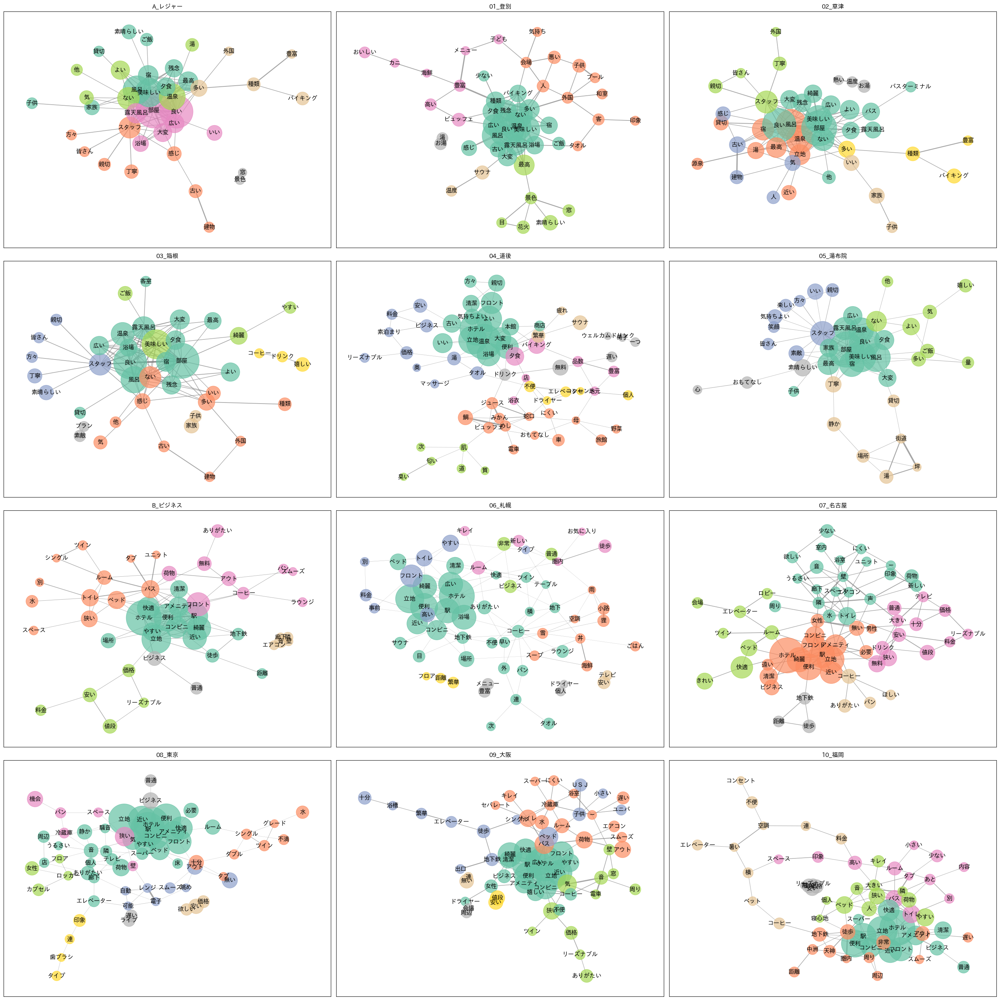

In [13]:
# 必要ライブラリのインポート
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
%matplotlib inline

# サブルーチン
def sort_and_plot(name, group):

    # 「カテゴリー」ごとに Jaccard 係数でソートする
    sorted_columns = np.argsort(jaccard_attrs_df.loc[name].values)[::-1][:75]

    # Jaccard 係数Top 75語をソートして抽出する
    group_cross_df = group.iloc[:,sorted_columns]

    # 共起行列を作成する
    X = group_cross_df.values
    X = csc_matrix(X)
    Xc = (X.T * X)
    Xc = np.triu(Xc.toarray())

    # 共起行列を DataFrame に整える
    group_cooccur_df = pd.DataFrame(Xc, columns=group_cross_df.columns, index=group_cross_df.columns)

    # 共起行列の中身を Jaccard 係数に入れ替える
    group_jaccard_df = gssm_utils.jaccard_coef(group_cooccur_df, group_cross_df)

    # 抽出語の出現回数を取得する
    word_counts = group_cross_df.sum(axis=0).values

    # プロットする
    ax = fig.add_subplot(4, 3, i+1)
    pyvis_plot = gssm_utils.plot_cooccur_network_ax(ax, group_jaccard_df, word_counts, np.sort(group_jaccard_df.values.reshape(-1))[::-1][120], pyvis=True, name=f"{name}.html")
    ax.set_title(name)
    display(pyvis_plot)

# プロットの準備
# fig = plt.figure(figsize=(20, 28))
fig = plt.figure(figsize=(28, 28))

i = 0
# カテゴリごとのループ
for name, group in cross_1000_df.groupby(level='カテゴリー'):
    # サブルーチンを呼ぶ
    sort_and_plot(name, group)
    i += 1

    # エリアごとのループ
    for sub_name, sub_group in group.groupby(level='エリア'):
        # サブルーチンを呼ぶ
        sort_and_plot(sub_name, sub_group)
        i += 1

# プロットの仕上げ
plt.tight_layout()
plt.show()

#### 1.2.5 係り受け行列を作成する (抽出語-抽出語)

In [29]:
# 必要ライブラリのインポート
from scipy.sparse import csc_matrix

# 共起行列を作成する
X = cross_1000_df.values
X = csc_matrix(X)
Xc = (X.T * X)
# 対角成分のみにする
Xc = np.triu(Xc.toarray())

# DataFrame 型に整える
cooccur_1000_df = pd.DataFrame(Xc, columns=cross_1000_df.columns, index=cross_1000_df.columns)

# チャンク(文節)から単語を取り出す
def get_words(tree, from_chunk, stopwords):

    # チャンク(文節)の開始位置を取得する
    beg = from_chunk.token_pos

    # チャンクの開始位置を取得する
    end = from_chunk.token_pos + from_chunk.token_size

    # 抽出語情報リストの初期化
    words = []

    # チャンク(文節)ごとのループ
    for i in range(beg, end):

        # チャンク中の形態素を取り出す
        token = tree.token(i)

        # 解析結果を要素ごとにバラす
        features = token.feature.split(',')

        # 品詞1 を取り出す
        pos1 = features[0]

        # 品詞2 を取り出す
        pos2 = features[1] if len(features) > 1 else ""

        # 原形 を取り出す
        base = features[6] if len(features) > 6 else None

        # 原型がストップワードに含まれない単語のみ抽出する
        if base not in stopwords:

            # 「名詞-一般」
            if (pos1 == "名詞" and pos2 == "一般"):
                base = base if base is not None else node.surface
                postag = "名詞"
                key = (base, postag)

                # 抽出語情報をリストに追加する
                words.append(key)

            # 「形容動詞」
            elif (pos1 == "名詞" and pos2 == "形容動詞語幹"):
                base = base if base is not None else node.surface
                base = f"{base}だ"
                postag = "形容動詞"
                key = (base, postag)

                # 抽出語情報をリストに追加する
                words.append(key)

            # 「形容詞」
            elif pos1 == "形容詞":
                base = base if base is not None else node.surface
                postag = "形容詞"
                key = (base, postag)

                # 抽出語情報をリストに追加する
                words.append(key)

            # 「未知語」
            elif pos1 == "未知語":
                base = base if base is not None else node.surface
                postag = "未知語"
                key = (base, postag)

                # 抽出語情報をリストに追加する
                words.append(key)

    # 抽出語情報をリストを返却する
    return words


# 必要ライブラリのインポート
import CaboCha

# cabocha の初期化
cp = CaboCha.Parser("-r ./tools/usr/local/etc/cabocharc")

# 半角->全角変換マクロを定義する
ZEN = "".join(chr(0xff01 + i) for i in range(94))
HAN = "".join(chr(0x21 + i) for i in range(94))
HAN2ZEN = str.maketrans(HAN, ZEN)

# ストップワードを定義する
# stopwords = ['する', 'ある', 'ない', 'いう', 'もの', 'こと', 'よう', 'なる', 'ほう']
stopwords = ['*']  # 原形に 「'*'」 が出力された場合に除去するため

# 係り受けペア辞書の初期化
pair_counts = defaultdict(lambda: 0)
pairs = []

# データ1行ごとのループ
for index, row in all_df.iterrows():

    # 半角->全角変換した後で, cabocha で解析する
    tree = cp.parse(row["コメント"].translate(HAN2ZEN))

    # 解析結果から空でないチャンク(文節)のリストを集める
    chunks = {}
    key = 0
    for i in range(tree.size()):
        tok = tree.token(i)
        if tok.chunk:
            chunks[key] = tok.chunk
            key += 1

    # 係り元と係り先の単語情報(原形と品詞)を集める
    from_words, to_words = [], []
    for from_chunk in chunks.values():
        # 係り先がなければスキップ
        if from_chunk.link < 0:
            continue

        # 係り先のチャンク(文節)を取得する
        to_chunk = chunks[from_chunk.link]

        # 係り元の単語情報(原形と品詞)を取得する
        from_words = get_words(tree, from_chunk, stopwords)

        # 係り先の単語情報(原形と品詞)を取得する
        to_words = get_words(tree, to_chunk, stopwords)

    # 係り受けペアと頻度を収集する
    for f in from_words:
        for t in to_words:
            key = (f[0], t[0])
            pair_counts[key] += 1


# 係り受け行列を初期化する (共起行列と同じ形)
Xd = np.zeros(cooccur_1000_df.shape)

# 係り受けペアを係り受け列に変換する
for (f,t), v in pair_counts.items():
    columns = list(cooccur_1000_df.columns)
    if f in columns and t in columns:
        i = columns.index(f)
        j = columns.index(t)
        Xd[i,j] = v

# DataFrme 型に整える
dep_1000_df = pd.DataFrame(Xd, columns=cooccur_1000_df.columns, index=cooccur_1000_df.columns)
print(dep_1000_df.shape)
display(dep_1000_df.head())

(1000, 1000)


表層,部屋,良い,ホテル,風呂,美味しい,ない,温泉,スタッフ,立地,よい,...,鳥,寝具,公共,年齢,大量,ファミリー,め,ｉｎ,たっぷり,幼児
表層,,,,,,,,,,,,,,,,,,,,,
部屋,0.0,9.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
良い,1.0,2.0,27.0,0.0,0.0,1.0,1.0,0.0,2.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
ホテル,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
風呂,0.0,15.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
美味しい,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [26]:
from_chunk.link

-1

#### 1.2.6 係り受けネットワーク図

In [ ]:
# 必要ライブラリのインポート
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
%matplotlib inline

# サブルーチン
def sort_and_plot(name, group, pos):

    # 「カテゴリー」ごとに Jaccard 係数でソートする
    sorted_columns = np.argsort(jaccard_attrs_df.loc[name].values)[::-1][:75]

    # Jaccard 係数Top 75語をソートして抽出する
    group_cross_df = group.iloc[:,sorted_columns]

    # 抽出語の出現回数を取得する
    word_counts = group_cross_df.sum(axis=0).values

    # 共起行列を作成する
    X = group_cross_df.values
    X = csc_matrix(X)
    Xc = (X.T * X)
    Xc = np.triu(Xc.toarray())

    # 共起行列を DataFrame に整える
    group_cooccur_df = pd.DataFrame(Xc, columns=group_cross_df.columns, index=group_cross_df.columns)

    # 係り受け行列(条件付き確率)を初期化する (共起行列と同じ形)
    Xd = np.zeros(group_cooccur_df.shape)

    # 係り受けペアを係り受け行列(条件付き確率)に変換する
    for (f,t), v in pair_counts.items():

        # 係り元と係り先の両方が列に含まれる
        columns = list(group_cooccur_df.columns)
        if f in columns and t in columns:
            i = columns.index(f)
            j = columns.index(t)

            # 条件付き確率(係り受け頻度/係り先出現回数)を求める
            Xd[i,j] = v / word_counts[i]

    # 係り受け行列(条件付き確率)を DataFrame 型に整える
    group_dependency_df = pd.DataFrame(Xd, columns=group_cross_df.columns, index=group_cross_df.columns)

    # プロットする
    ax = fig.add_subplot(4, 3, pos+1)
    pyvis_plot = gssm_utils.plot_dependency_network_ax(ax, group_dependency_df, word_counts, np.sort(group_dependency_df.values.reshape(-1))[::-1][120], pyvis=False, name=f"{name}.html")
    ax.set_title(name)
    # display(pyvis_plot)

    # 係り受けペアを条件付き確率で降順にソートし10件表示する
    Xc = group_dependency_df.values
    words = group_dependency_df.columns
    flat_indices = np.argsort(Xc.ravel())[::-1][:10]
    row_indices, col_indices = np.unravel_index(flat_indices, Xc.shape)
    for idx in range(len(flat_indices)):
        value = Xc[row_indices[idx], col_indices[idx]]
        print(f"[{name}] {words[row_indices[idx]]} - {words[col_indices[idx]]}: {value:.04f}")

# プロットの準備
# fig = plt.figure(figsize=(20, 28))
fig = plt.figure(figsize=(28, 28))

i = 0
# カテゴリごとのループ
for name, group in cross_1000_df.groupby(level='カテゴリー'):
    # サブルーチンを呼ぶ
    sort_and_plot(name, group, i)
    i += 1

    # エリアごとのループ
    for sub_name, sub_group in group.groupby(level='エリア'):
        # サブルーチンを呼ぶ
        sort_and_plot(sub_name, sub_group, i)
        i += 1

# プロットの仕上げ
plt.tight_layout()
plt.show()

### 1.3 高評価のエリアに倣って、低評価のエリアを改善するプランを提案する

#### 1.3.1 対照的な2エリアを選択する

In [30]:
# コーディングルール
coding_pos = ["良い","美味しい","広い","多い","素晴らしい","嬉しい","気持ちよい","楽しい","近い","大きい","気持ち良い","温かい","早い","優しい","新しい","暖かい","快い","明るい","美しい","可愛い","満足"]
coding_neg = ["古い","無い","高い","悪い","小さい","狭い","少ない","寒い","遅い","熱い","欲しい","暑い","冷たい","遠い","臭い","暗い","うるさい","ない","無い","残念","改善","不満"]

In [31]:
# DataFrame を初期化する
cross_1000_ps_df = cross_1000_df.copy()
cross_1000_ps_df['ポジ'] = 0
cross_1000_ps_df['ネガ'] = 0
cross_1000_ps_df['総合1-2'] = 0
cross_1000_ps_df['総合4-5'] = 0

# コーディングルールを適用する (ポジ・ネガ)
pos_index = docs_df['表層'].str.contains("|".join(coding_pos))
neg_index = docs_df['表層'].str.contains("|".join(coding_neg))
cross_1000_ps_df.loc[cross_1000_ps_df.index.get_level_values('文書ID').isin(docs_df.loc[pos_index, '文書ID']), 'ポジ'] = 1
cross_1000_ps_df.loc[cross_1000_ps_df.index.get_level_values('文書ID').isin(docs_df.loc[neg_index, '文書ID']), 'ネガ'] = 1

# コーディングルールを適用する (総合評価)
cross_1000_ps_df.loc[cross_1000_ps_df.index.get_level_values('文書ID').isin(all_df[all_df['総合'] <=2].index), '総合1-2'] = 1
cross_1000_ps_df.loc[cross_1000_ps_df.index.get_level_values('文書ID').isin(all_df[all_df['総合'] >=4].index), '総合4-5'] = 1
cross_1000_ps_df = cross_1000_ps_df[['ポジ','ネガ','総合1-2','総合4-5']]

# DataFrame を表示する
print(cross_1000_ps_df.shape)
display(cross_1000_ps_df)

(9884, 4)


表層                  ポジ  ネガ  総合1-2  総合4-5
カテゴリー  エリア   文書ID                       
A_レジャー 01_登別 1       1   0      0      1
             2       0   1      0      1
             3       1   1      0      1
             4       1   0      0      1
             5       1   0      0      1
...                 ..  ..    ...    ...
B_ビジネス 10_福岡 9996    1   1      0      1
             9997    0   0      0      1
             9998    1   1      0      1
             9999    1   1      0      1
             10000   1   0      0      0

[9884 rows x 4 columns]

In [32]:
# 「カテゴリー」のクロス集計と「エリア」のクロス集計を連結する
aggregate_ps_df = pd.concat(
    [
        cross_1000_ps_df.groupby(level='カテゴリー').sum(),
        cross_1000_ps_df.groupby(level='エリア').sum()
    ]
)

# DataFrame を表示する
print(aggregate_ps_df.shape)
display(aggregate_ps_df)

(12, 4)


表層,ポジ,ネガ,総合1-2,総合4-5
A_レジャー,3785,2241,250,4309
B_ビジネス,3094,1998,241,4065
01_登別,720,469,67,817
02_草津,775,487,57,857
03_箱根,818,463,55,868
04_道後,668,386,36,857
05_湯布院,804,436,35,910
06_札幌,643,376,47,826
07_名古屋,605,433,48,803
08_東京,594,399,50,812


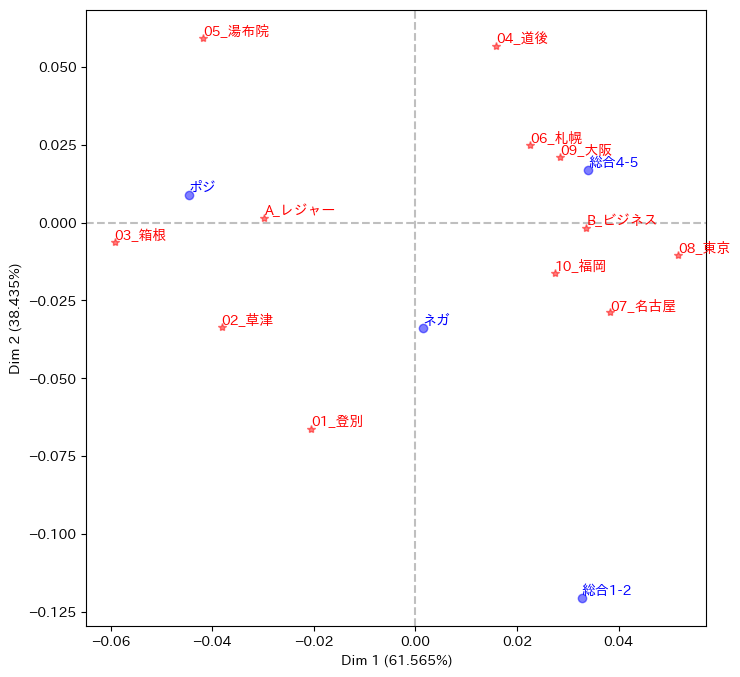

In [33]:
# 必要ライブラリのインポート
import mca

# ライブラリ mca による対応分析
ncols = aggregate_ps_df.shape[1]
mca_ben = mca.MCA(aggregate_ps_df, ncols=ncols, benzecri=False)

# 行方向および列方向の値を取り出す
row_coord = mca_ben.fs_r(N=2)
col_coord = mca_ben.fs_c(N=2)

# 固有値を求める
eigenvalues = mca_ben.L
total = np.sum(eigenvalues)
# 寄与率を求める
explained_inertia = 100 * eigenvalues / total

# 行方向および列方向のラベルを取得する
row_labels = aggregate_ps_df.index
col_labels = aggregate_ps_df.columns

# プロットする
gssm_utils.plot_coresp(row_coord, col_coord, row_labels, col_labels, explained_inertia)

#### 1.3.2 ポジティブ意見の共起ネットワーク図を作成する

pos-A_レジャー.html


pos-01_登別.html


pos-02_草津.html


pos-03_箱根.html


pos-04_道後.html


pos-05_湯布院.html


pos-B_ビジネス.html


pos-06_札幌.html


pos-07_名古屋.html


pos-08_東京.html


pos-09_大阪.html


pos-10_福岡.html


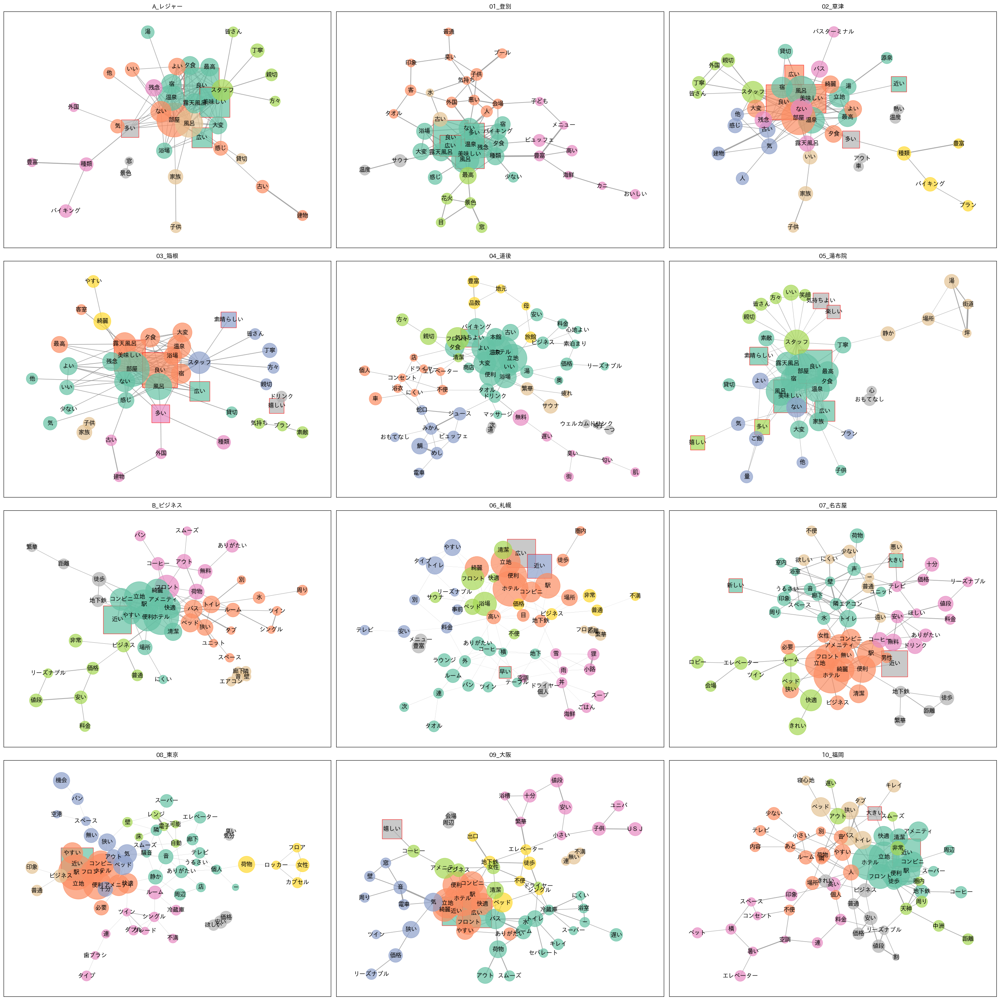

In [34]:
# 必要ライブラリのインポート
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
%matplotlib inline

# コーディングルール
coding_or = coding_pos

# サブルーチン
def sort_and_plot(name, group):

    # 「カテゴリー」ごとに Jaccard 係数でソートする
    sorted_columns = np.argsort(jaccard_attrs_df.loc[name].values)[::-1][:75]

    # Jaccard 係数Top 75語をソートして抽出する
    group_cross_df = group.iloc[:,sorted_columns]

    # 共起行列を作成する
    X = group_cross_df.values
    X = csc_matrix(X)
    Xc = (X.T * X)
    Xc = np.triu(Xc.toarray())

    # コーディングルールで絞り込む
    index = docs_df['表層'].str.contains("|".join(coding_or))
    group_cross_df = group_cross_df[group_cross_df.index.get_level_values('文書ID').isin(docs_df.loc[index, '文書ID'])]

    # 共起行列を DataFrame に整える
    group_cooccur_df = pd.DataFrame(Xc, columns=group_cross_df.columns, index=group_cross_df.columns)

    # 共起行列の中身を Jaccard 係数に入れ替える
    group_jaccard_df = gssm_utils.jaccard_coef(group_cooccur_df, group_cross_df)

    # 抽出語の出現回数を取得する
    word_counts = group_cross_df.sum(axis=0).values

    # プロットする
    ax = fig.add_subplot(4, 3, i+1)
    pyvis_plot = gssm_utils.plot_cooccur_network_with_code_ax(ax, group_jaccard_df, word_counts, np.sort(group_jaccard_df.values.reshape(-1))[::-1][120], coding_or, pyvis=True, name=f"pos-{name}.html")
    ax.set_title(name)
    display(pyvis_plot)

# プロットの準備
# fig = plt.figure(figsize=(20, 28))
fig = plt.figure(figsize=(28, 28))

i = 0
# カテゴリごとのループ
for name, group in cross_1000_df.groupby(level='カテゴリー'):
    # サブルーチンを呼ぶ
    sort_and_plot(name, group)
    i += 1

    # エリアごとのループ
    for sub_name, sub_group in group.groupby(level='エリア'):
        # サブルーチンを呼ぶ
        sort_and_plot(sub_name, sub_group)
        i += 1

# プロットの仕上げ
plt.tight_layout()
plt.show()

#### 1.3.3 ポジティブ意見の係り受けネットワーク図を作成する

[A_レジャー] 良い - 感じ: 0.0364
[A_レジャー] 美味しい - ご飯: 0.0331
[A_レジャー] 良い - 雰囲気: 0.0324
[A_レジャー] 良い - 気持ち: 0.0231
[A_レジャー] 嬉しい - ドリンク: 0.0210
[A_レジャー] 良い - 味: 0.0199
[A_レジャー] 良い - すごい: 0.0192
[A_レジャー] 良い - 景色: 0.0164
[A_レジャー] 良い - サウナ: 0.0145
[A_レジャー] 宿 - 優しい: 0.0144
[A_レジャー] 宿 - 素晴らしい: 0.0104
[A_レジャー] 良い - 風呂: 0.0102
[A_レジャー] 美味しい - バイキング: 0.0094
[01_登別] 良い - 雰囲気: 0.1944
[01_登別] 美味しい - ご飯: 0.1923
[01_登別] 良い - 感じ: 0.1867
[01_登別] 良い - 気持ち: 0.1429
[01_登別] 良い - すごい: 0.1111
[01_登別] 良い - 味: 0.1111
[01_登別] 良い - 景色: 0.0667
[01_登別] 宿 - 素晴らしい: 0.0563
[01_登別] 良い - 風呂: 0.0498
[01_登別] 気持ちよい - 泉: 0.0455
[01_登別] 多い - メニュー: 0.0417
[01_登別] 良い - メニュー: 0.0417
[02_草津] 美味しい - ご飯: 0.1754
[02_草津] 良い - 感じ: 0.1687
[02_草津] 良い - 雰囲気: 0.1591
[02_草津] 良い - 立地: 0.0994
[02_草津] 良い - 距離: 0.0938
[02_草津] 良い - すごい: 0.0789
[02_草津] 良い - 無料: 0.0600
[02_草津] 良い - 近い: 0.0595
[02_草津] 宿 - 素晴らしい: 0.0563
[02_草津] 宿 - 優しい: 0.0500
[02_草津] 良い - 値段: 0.0476
[02_草津] 良い - 風呂: 0.0414
[02_草津] 良い - 種類: 0.0395
[03_箱根] 良い - 雰囲気: 0.1458
[03_箱根] 良い - 感じ: 

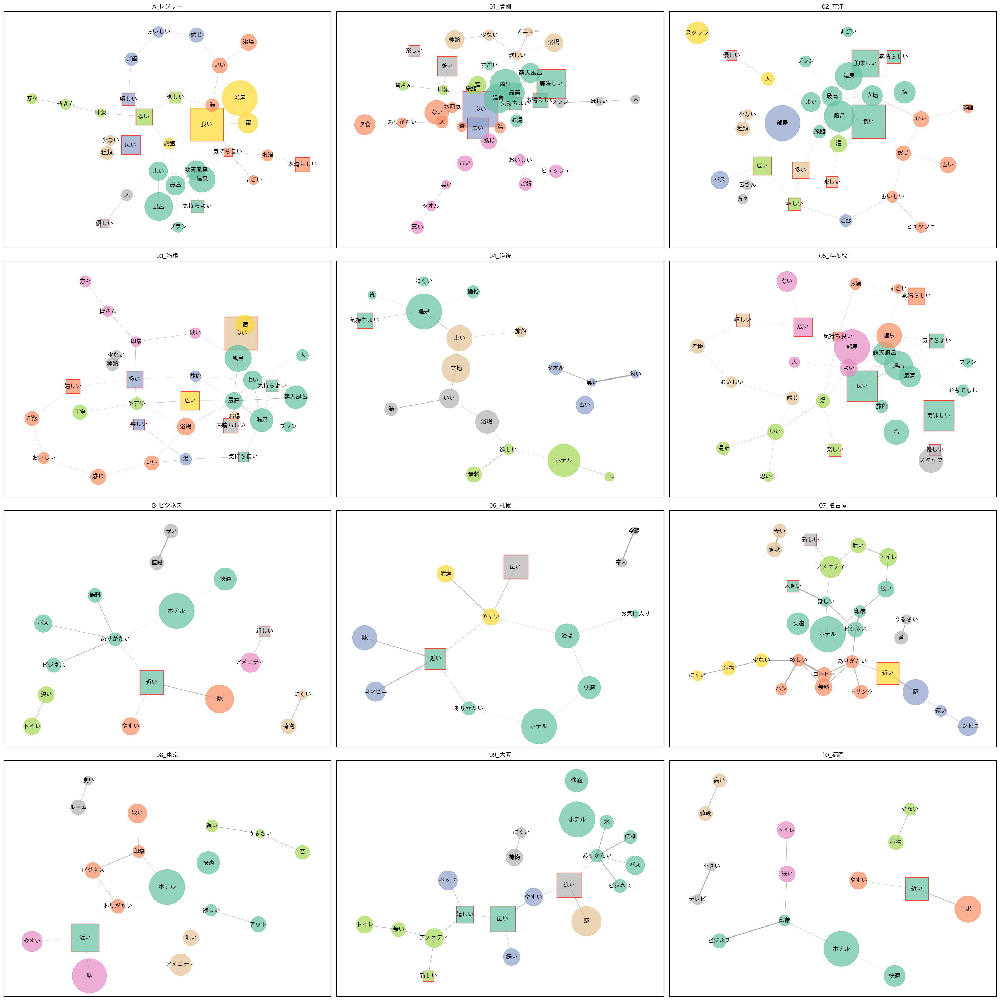

In [35]:
# 必要ライブラリのインポート
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
%matplotlib inline

# コーディングルール
coding_or = coding_pos

# サブルーチン
def sort_and_plot(name, group, pos):

    # 「カテゴリー」ごとに Jaccard 係数でソートする
    sorted_columns = np.argsort(jaccard_attrs_df.loc[name].values)[::-1][:75]

    # Jaccard 係数Top 75語をソートして抽出する
    group_cross_df = group.iloc[:,sorted_columns]

    # 抽出語の出現回数を取得する
    word_counts = group_cross_df.sum(axis=0).values

    # 共起行列を作成する
    X = group_cross_df.values
    X = csc_matrix(X)
    Xc = (X.T * X)
    Xc = np.triu(Xc.toarray())

    # コーディングルールで絞り込む
    index = docs_df['表層'].str.contains("|".join(coding_or))
    group_cross_df = group_cross_df[group_cross_df.index.get_level_values('文書ID').isin(docs_df.loc[index, '文書ID'])]

    # 共起行列を DataFrame に整える
    group_cooccur_df = pd.DataFrame(Xc, columns=group_cross_df.columns, index=group_cross_df.columns)

    # 係り受け行列(条件付き確率)を初期化する (共起行列と同じ形)
    Xd = np.zeros(group_cooccur_df.shape)

    # 係り受けペアを係り受け行列(条件付き確率)に変換する
    for (f,t), v in pair_counts.items():

        # 係り元と係り先の両方が列に含まれる
        columns = list(group_cooccur_df.columns)
        if f in columns and t in columns:
            i = columns.index(f)
            j = columns.index(t)

            # 条件付き確率(係り受け頻度/係り先出現回数)を求める
            Xd[i,j] = v / word_counts[i]

    # 係り受け行列(条件付き確率)を DataFrame 型に整える
    group_dependency_df = pd.DataFrame(Xd, columns=group_cross_df.columns, index=group_cross_df.columns)

    # プロットする
    ax = fig.add_subplot(4, 3, pos+1)
    pyvis_plot = gssm_utils.plot_cooccur_network_with_code_ax(ax, group_dependency_df, word_counts, np.sort(group_dependency_df.values.reshape(-1))[::-1][120], coding_or, pyvis=False, name=f"pos-{name}.html")
    ax.set_title(name)
    # display(pyvis_plot)

    # 係り受けペアを条件付き確率で降順にソートし10件表示する
    Xc = group_dependency_df.values
    words = group_dependency_df.columns
    flat_indices = np.argsort(Xc.ravel())[::-1][:20]
    row_indices, col_indices = np.unravel_index(flat_indices, Xc.shape)
    for idx in range(len(flat_indices)):
        if words[row_indices[idx]] in coding_or or words[col_indices[idx]] in coding_or:
            value = Xc[row_indices[idx], col_indices[idx]]
            print(f"[{name}] {words[col_indices[idx]]} - {words[row_indices[idx]]}: {value:.04f}")

# プロットの準備
# fig = plt.figure(figsize=(20, 28))
fig = plt.figure(figsize=(28, 28))

i = 0
# カテゴリごとのループ
for name, group in cross_1000_df.groupby(level='カテゴリー'):
    # サブルーチンを呼ぶ
    sort_and_plot(name, group, i)
    i += 1

    # エリアごとのループ
    for sub_name, sub_group in group.groupby(level='エリア'):
        # サブルーチンを呼ぶ
        sort_and_plot(sub_name, sub_group, i)
        i += 1

# プロットの仕上げ
plt.tight_layout()
plt.show()

#### 1.3.4 ネガティブ意見の共起ネットワーク図を作成する

neg-A_レジャー.html


neg-01_登別.html


neg-02_草津.html


neg-03_箱根.html


neg-04_道後.html


neg-05_湯布院.html


neg-B_ビジネス.html


neg-06_札幌.html


neg-07_名古屋.html


neg-08_東京.html


neg-09_大阪.html


neg-10_福岡.html


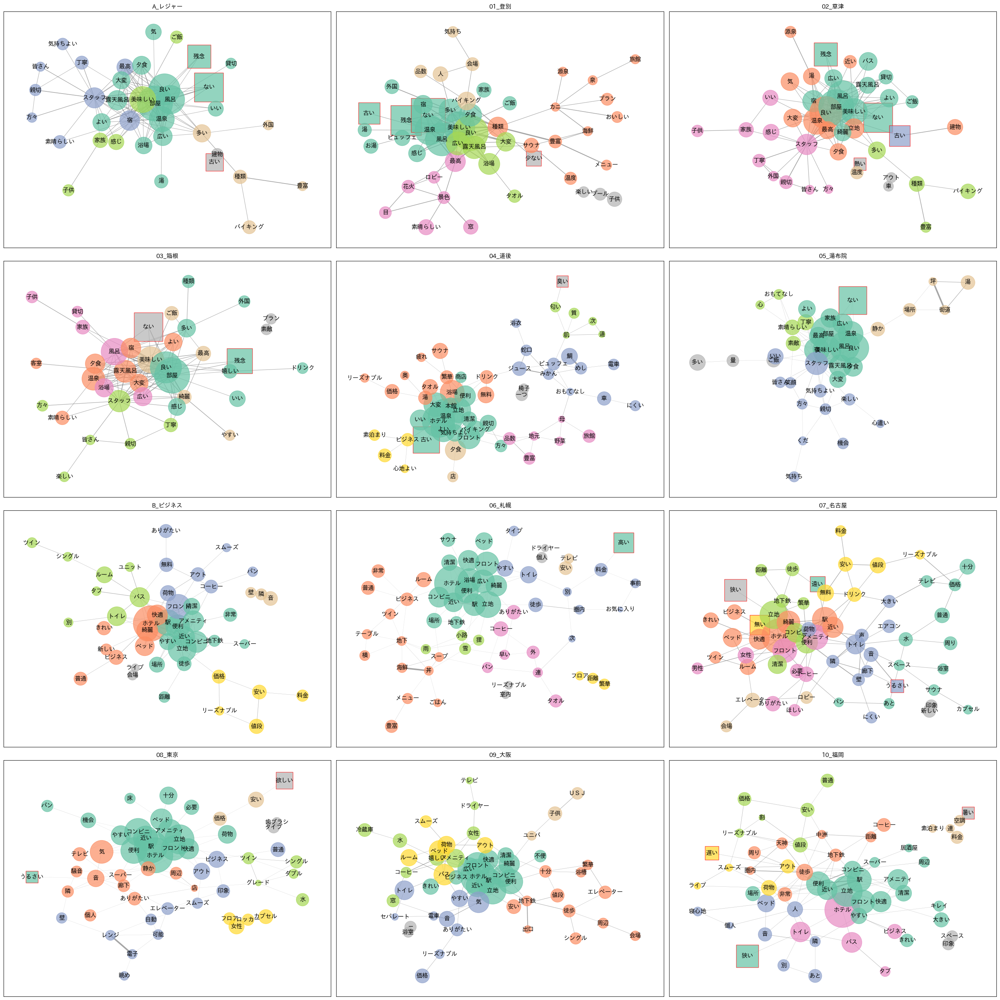

In [36]:
# 必要ライブラリのインポート
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
%matplotlib inline

# コーディングルール
coding_or = coding_neg

# サブルーチン
def sort_and_plot(name, group):

    # 「カテゴリー」ごとに Jaccard 係数でソートする
    sorted_columns = np.argsort(jaccard_attrs_df.loc[name].values)[::-1][:75]

    # Jaccard 係数Top 75語をソートして抽出する
    group_cross_df = group.iloc[:,sorted_columns]

    # 共起行列を作成する
    X = group_cross_df.values
    X = csc_matrix(X)
    Xc = (X.T * X)
    Xc = np.triu(Xc.toarray())

    # コーディングルールで絞り込む
    index = docs_df['表層'].str.contains("|".join(coding_or))
    group_cross_df = group_cross_df[group_cross_df.index.get_level_values('文書ID').isin(docs_df.loc[index, '文書ID'])]

    # 共起行列を DataFrame に整える
    group_cooccur_df = pd.DataFrame(Xc, columns=group_cross_df.columns, index=group_cross_df.columns)

    # 共起行列の中身を Jaccard 係数に入れ替える
    group_jaccard_df = gssm_utils.jaccard_coef(group_cooccur_df, group_cross_df)

    # 抽出語の出現回数を取得する
    word_counts = group_cross_df.sum(axis=0).values

    # プロットする
    ax = fig.add_subplot(4, 3, i+1)
    pyvis_plot = gssm_utils.plot_cooccur_network_with_code_ax(ax, group_jaccard_df, word_counts, np.sort(group_jaccard_df.values.reshape(-1))[::-1][120], coding_or, pyvis=True, name=f"neg-{name}.html")
    ax.set_title(name)
    display(pyvis_plot)

# プロットの準備
# fig = plt.figure(figsize=(20, 28))
fig = plt.figure(figsize=(28, 28))

i = 0
# カテゴリごとのループ
for name, group in cross_1000_df.groupby(level='カテゴリー'):
    # サブルーチンを呼ぶ
    sort_and_plot(name, group)
    i += 1

    # エリアごとのループ
    for sub_name, sub_group in group.groupby(level='エリア'):
        # サブルーチンを呼ぶ
        sort_and_plot(sub_name, sub_group)
        i += 1

# プロットの仕上げ
plt.tight_layout()
plt.show()

#### 1.3.5 ネガティブ意見の係り受けネットワーク図を作成する

[04_道後] 臭い - 匂い: 0.0714
[04_道後] 欲しい - 質: 0.0714
[04_道後] 欲しい - 野菜: 0.0667
[04_道後] 欲しい - メニュー: 0.0476
[04_道後] 臭い - タオル: 0.0294
[B_ビジネス] 狭い - 浴室: 0.0154
[06_札幌] 不満 - テーブル: 0.0714
[06_札幌] 高い - 料金: 0.0667
[07_名古屋] 狭い - 浴室: 0.0588
[07_名古屋] 欲しい - 早い: 0.0526
[07_名古屋] 欲しい - コーヒー: 0.0500
[08_東京] 欲しい - 歯ブラシ: 0.0833
[08_東京] 欲しい - ロッカー: 0.0667
[08_東京] 欲しい - パン: 0.0500
[08_東京] うるさい - 遅い: 0.0385
[09_大阪] 狭い - 浴室: 0.0588
[09_大阪] 小さい - テレビ: 0.0556
[09_大阪] にくい - 小さい: 0.0526
[10_福岡] 高い - 料金: 0.0769
[10_福岡] 少ない - コンセント: 0.0667
[10_福岡] やすい - 暑い: 0.0625
[10_福岡] 印象 - 小さい: 0.0588
[10_福岡] 小さい - テレビ: 0.0455


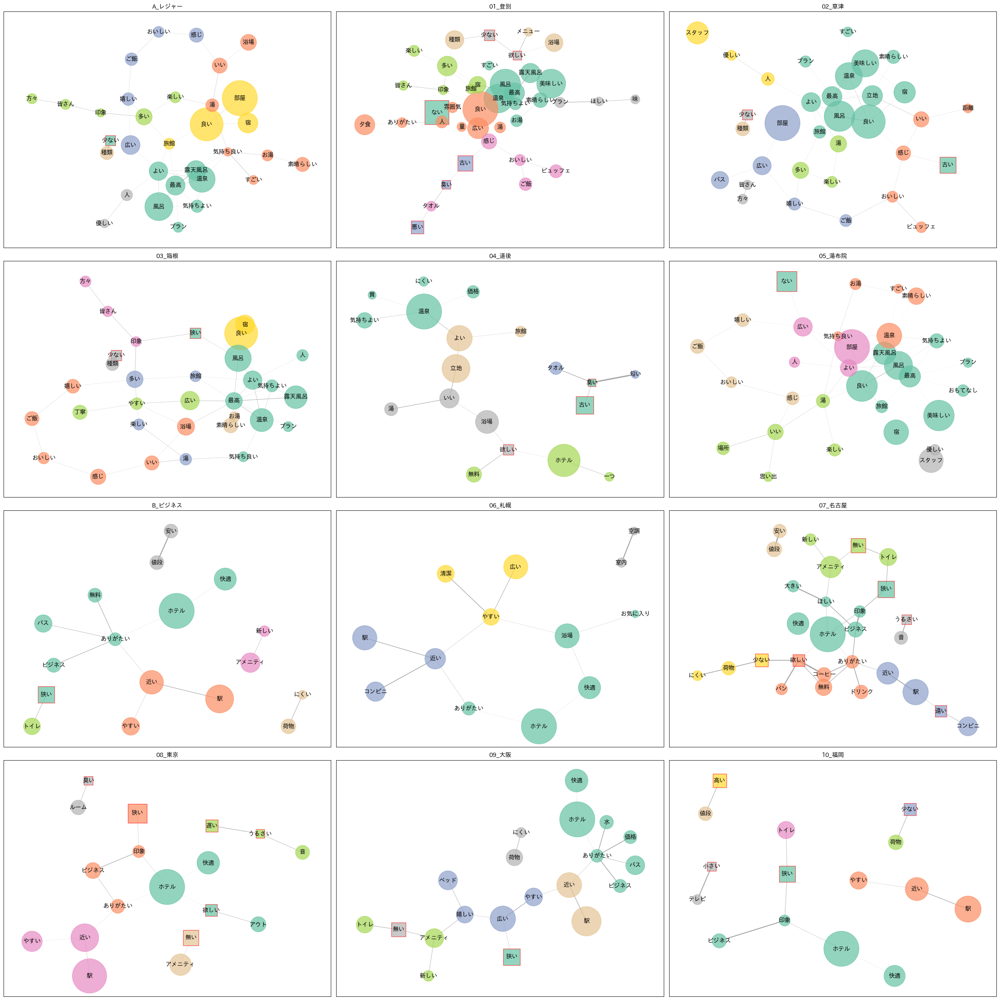

In [37]:
# 必要ライブラリのインポート
from scipy.sparse import csc_matrix
import matplotlib.pyplot as plt
%matplotlib inline

# コーディングルール
coding_or = coding_neg

# サブルーチン
def sort_and_plot(name, group, pos):

    # 「カテゴリー」ごとに Jaccard 係数でソートする
    sorted_columns = np.argsort(jaccard_attrs_df.loc[name].values)[::-1][:75]

    # Jaccard 係数Top 75語をソートして抽出する
    group_cross_df = group.iloc[:,sorted_columns]

    # 抽出語の出現回数を取得する
    word_counts = group_cross_df.sum(axis=0).values

    # 共起行列を作成する
    X = group_cross_df.values
    X = csc_matrix(X)
    Xc = (X.T * X)
    Xc = np.triu(Xc.toarray())

    # コーディングルールで絞り込む
    index = docs_df['表層'].str.contains("|".join(coding_or))
    group_cross_df = group_cross_df[group_cross_df.index.get_level_values('文書ID').isin(docs_df.loc[index, '文書ID'])]

    # 共起行列を DataFrame に整える
    group_cooccur_df = pd.DataFrame(Xc, columns=group_cross_df.columns, index=group_cross_df.columns)

    # 係り受け行列(条件付き確率)を初期化する (共起行列と同じ形)
    Xd = np.zeros(group_cooccur_df.shape)

    # 係り受けペアを係り受け行列(条件付き確率)に変換する
    for (f,t), v in pair_counts.items():

        # 係り元と係り先の両方が列に含まれる
        columns = list(group_cooccur_df.columns)
        if f in columns and t in columns:
            i = columns.index(f)
            j = columns.index(t)

            # 条件付き確率(係り受け頻度/係り先出現回数)を求める
            Xd[i,j] = v / word_counts[i]

    # 係り受け行列(条件付き確率)を DataFrame 型に整える
    group_dependency_df = pd.DataFrame(Xd, columns=group_cross_df.columns, index=group_cross_df.columns)

    # プロットする
    ax = fig.add_subplot(4, 3, pos+1)
    pyvis_plot = gssm_utils.plot_cooccur_network_with_code_ax(ax, group_dependency_df, word_counts, np.sort(group_dependency_df.values.reshape(-1))[::-1][120], coding_or, pyvis=False, name=f"pos-{name}.html")
    ax.set_title(name)
    # display(pyvis_plot)

    # 係り受けペアを条件付き確率で降順にソートし10件表示する
    Xc = group_dependency_df.values
    words = group_dependency_df.columns
    flat_indices = np.argsort(Xc.ravel())[::-1][:10]
    row_indices, col_indices = np.unravel_index(flat_indices, Xc.shape)
    for idx in range(len(flat_indices)):
        if words[row_indices[idx]] in coding_or or words[col_indices[idx]] in coding_or:
            value = Xc[row_indices[idx], col_indices[idx]]
            print(f"[{name}] {words[col_indices[idx]]} - {words[row_indices[idx]]}: {value:.04f}")

# プロットの準備
# fig = plt.figure(figsize=(20, 28))
fig = plt.figure(figsize=(28, 28))

i = 0
# カテゴリごとのループ
for name, group in cross_1000_df.groupby(level='カテゴリー'):
    # サブルーチンを呼ぶ
    sort_and_plot(name, group, i)
    i += 1

    # エリアごとのループ
    for sub_name, sub_group in group.groupby(level='エリア'):
        # サブルーチンを呼ぶ
        sort_and_plot(sub_name, sub_group, i)
        i += 1

# プロットの仕上げ
plt.tight_layout()
plt.show()

#### 1.3.4 本文の参照 (エリアで絞る)

「登別」と「道後」で「すばらしい」という単語が含まれている口コミを表示する

In [38]:
# 検索条件
search_index = \
    all_df['エリア'].isin(['01_登別', '04_道後']) & \
    (all_df['コメント'].str.contains('素晴らしい') | all_df['コメント'].str.contains('すばらしい'))

# 検索する
result_df = all_df[search_index]

# DataFrame を表示する
print(result_df.shape)
display(result_df.head())

# CSV に保存する
result_df.to_csv("output-1.csv", header=True)

(59, 19)


,カテゴリー,エリア,施設番号,施設名,コメント,総合,サービス,立地,部屋,設備・アメニティ,風呂,食事,旅行の目的,同伴者,宿泊年月,投稿者,年代,性別,投稿日
5,A_レジャー,01_登別,172346,ザ・レイクスイート湖の栖（グランベルホテルズ&リゾーツ）,レイクビューのとても素晴らしいお部屋でした。部屋の温泉もとてもよかったです。お食事がバイキン...,4,4,5,5,4.0,5.0,3.0,レジャー,家族,45566,maruenmori,40代,女性,45596.713044
18,A_レジャー,01_登別,29995,ゆとりろ洞爺湖,接客が全体的によかったです。オールインクルーシブで部屋にもドリンクを持ち込めるのが良かったで...,4,4,4,3,4.0,4.0,3.0,レジャー,家族,45413,投稿者,na,na,45425.754792
71,A_レジャー,01_登別,192614,リブマックスリゾート ウポポイ白老温泉,空調はないが北海道で大変に気候も良く、風通しも良い。暑い暑いと言っている人はロシアから来たの...,5,5,5,5,5.0,5.0,5.0,レジャー,家族,45536,投稿者,na,na,45553.540035
78,A_レジャー,01_登別,30109,登別温泉 第一滝本館,西館バリアフリーのお部屋はもともとの和室を繋げて一室分を洋室にしたようなお部屋でした。従来の...,2,3,3,2,3.0,2.0,3.0,レジャー,家族,45566,こゆたんピ,50代,女性,45581.735185
142,A_レジャー,01_登別,18832,きたゆざわ 森のソラニワ,八月下旬に泊まりました！お食事もお部屋も文句無し！子供連れにありがたいホテルです。ただ、どう...,5,4,4,5,4.0,4.0,5.0,レジャー,家族,45505,投稿者,na,na,45570.455683


「東京」と「福岡」で「うるさい」という単語が含まれている口コミを表示する

In [39]:
# 検索条件
search_index = \
    all_df['エリア'].isin(['08_東京', '10_福岡']) & \
    all_df['コメント'].str.contains('うるさい')

# 検索する
result_df = all_df[search_index]

# DataFrame を表示する
print(result_df.shape)
display(result_df.head())

# CSV に保存する
result_df.to_csv("output-2.csv", header=True)

(8, 19)


,カテゴリー,エリア,施設番号,施設名,コメント,総合,サービス,立地,部屋,設備・アメニティ,風呂,食事,旅行の目的,同伴者,宿泊年月,投稿者,年代,性別,投稿日
7024,B_ビジネス,08_東京,188775,アパホテル〈上野 御徒町駅前南〉,部屋が暑い。空調が館内全体管理とのこと。窓開けるが外うるさい。室内での空調調整出来るようにし...,3,4,5,3,4.0,3.0,5.0,レジャー,家族,45352,投稿者,na,na,45355.345289
7051,B_ビジネス,08_東京,101,シティホテル弘城,8月23日（金）に都心周辺でホテルを探していたところ、どこも1万円以上の料金で、1万円以下の...,5,5,5,5,5.0,5.0,NaN,レジャー,一人,45505,投稿者,na,na,45529.714132
7232,B_ビジネス,08_東京,32096,カプセル＆サウナ 池袋プラザ,コスパは最高。ただ周りにイビキのうるさい人が来ると最低。かなり運に左右される。,4,4,4,4,4.0,4.0,4.0,レジャー,一人,45383,投稿者,na,na,45410.853438
7297,B_ビジネス,08_東京,1993,お茶の水イン,部屋はコンパクトながら不便はなかったです。夜遅くまで用事があり、ゆっくり寝たいから12時チェ...,3,2,4,4,3.0,3.0,NaN,その他,一人,45658,ゆうゆう12071207,50代,女性,45691.030046
7364,B_ビジネス,08_東京,130006,ヴィアイン新宿（ＪＲ西日本グループ）,ビジネスにて利用しました。ヴィアインは他所でもお仕事で何度か利用しており、非常にスムーズでし...,5,5,5,5,5.0,4.0,NaN,ビジネス,一人,45292,DJDJDJDJ,40代,男性,45303.572917
